In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:

import torch
import torch.nn as nn
from torchsummary import summary
import os
import torch.optim as optim
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image
from torch.utils.data import Dataset
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import pandas as pd
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import torch.nn.functional as F
from torch.utils.data import Dataset
import torchvision
from torchvision.utils import save_image
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from torch.autograd import Function

In [3]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

print('Using device:', device)
print()

Using device: cpu



In [4]:
# annotation_train = '/content/drive/MyDrive/DL_ASSIGN_05/Annotations_HCM/train'
# train_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/train/'
# annotation_val ='/content/drive/MyDrive/DL_ASSIGN_05/Annotations_HCM/val'
# val_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/val/'
# annotation_test = '/content/drive/MyDrive/DL_ASSIGN_05/Annotations_HCM/test'
# test_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/test/'

In [5]:
# df = pd.DataFrame(columns=['filename', 'ring', 'trophozoite', 'schizont', 'gametocyte'])

In [6]:
# for directory, folders, files in os.walk(annotation_val):
#   for file in files:
#         index = 0
#         file_path = os.path.join(directory, file)

#         tree = ET.parse(file_path)
#         root = tree.getroot()
#         filename = root.find('filename')
#         file_name = filename.text
#         print(file_name)
#         a = root.findall('object')
#         l = []
#         for i in a:
#           label = i.find('name')
#           label_name = label.text
#           l.append(label_name)
#           print(label_name)

#         unique_label = list(set(l))
#         images_file = os.listdir(val_path)
#         if file_name in images_file:
#           path = val_path + file_name

          # data_dict = {'filename': path}


          # for label in l:
          #     data_dict[label] = 1


          # new_df = pd.DataFrame(data_dict, index=[index])
          # df = pd.concat([df, new_df], ignore_index=True)
          # index = index + 1




In [7]:
# df = df.fillna(0)
# file_path = '/content/drive/MyDrive/DL_ASSIGN_05/labels_val.csv'
# df.to_csv(file_path, index=False)
# print(df)

In [8]:
train_path = '/content/drive/MyDrive/DL_ASSIGN_05/labels_train.csv'
test_path = '/content/drive/MyDrive/DL_ASSIGN_05/labels_test.csv'
val_path = '/content/drive/MyDrive/DL_ASSIGN_05/labels_val.csv'

In [9]:
class CustomImageDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
        self.images, self.labels = self.image_label(data)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("RGB")
        label = self.labels[idx]
        label = torch.Tensor(label)

        if self.transform:
            image = self.transform(image)
        return image, label

    @staticmethod
    def image_label(data):
        file = pd.read_csv(data)
        images = file['filename'].tolist()
        labels = file.iloc[:, 1:].values.tolist()
        return images, labels

In [10]:
# def image_label(data):
#   file = pd.read_csv(data)
#   images = file['filename'].tolist()
#   labels = file.iloc[:, 1:].values.tolist()
#   return images ,labels

In [11]:

transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

In [12]:
num_epochs = 15
batch_size = 64
lr = 0.0001
beta1 = 0.5
beta2 = 0.999


In [13]:
train = CustomImageDataset(data = train_path, transform=transform)
train_loader = DataLoader(train, batch_size=batch_size)
test = CustomImageDataset(data = test_path, transform=transform)
test_loader = DataLoader(test, batch_size=batch_size)
val = CustomImageDataset(data =  val_path, transform=transform)
val_loader = DataLoader(val, batch_size=batch_size)

In [22]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(

            nn.Conv2d(3,32, 4,2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(), # Flatten the output from global average pooling
            nn.Linear(128*4*4,128*4*4),  # Adjusted to 512 units in the first linear layer
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128*4*4, 4) , # Output size adjusted to num_classes
            nn.Sigmoid()
        )

    def forward(self, x):
      output = self.discriminator(x)

      output = self.classifier(output)
      return output

In [15]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(

            nn.ConvTranspose2d(100, 128, 4, 1, 0, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, 4, 2,1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(32, 3,4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.generator(x)

In [16]:
disc = Discriminator().to(device)
gen = Generator().to(device)

optimizer_discriminator = optim.Adam(disc.parameters(), lr=lr, betas=(beta1, beta2))
optimizer_generator = optim.Adam(gen.parameters(), lr=lr, betas=(beta1, beta2))

criterion = nn.BCELoss()
# input_size = (3, 32, 32)
# summary(discriminator, input_size)

Epoch [0/15], Batch [0/14], Discriminator Loss: 1.4657, Generator Loss: 0.6120


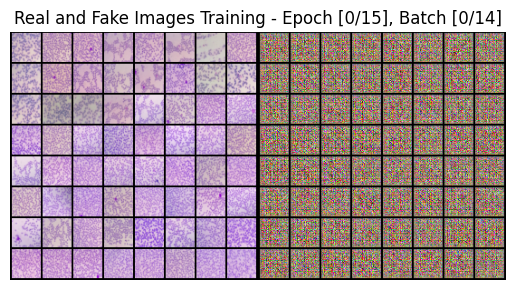

Epoch [0/15], Batch [1/14], Discriminator Loss: 1.2074, Generator Loss: 0.5386


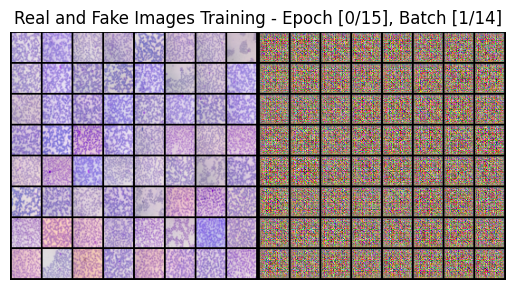

Epoch [0/15], Batch [2/14], Discriminator Loss: 0.9843, Generator Loss: 0.5292


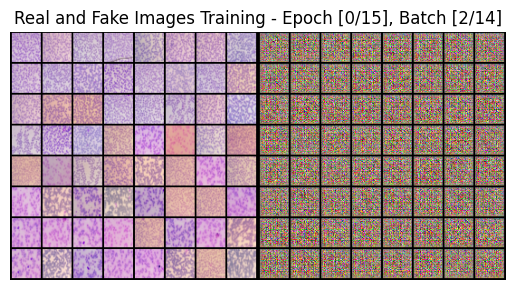

Epoch [0/15], Batch [3/14], Discriminator Loss: 0.8728, Generator Loss: 0.4994


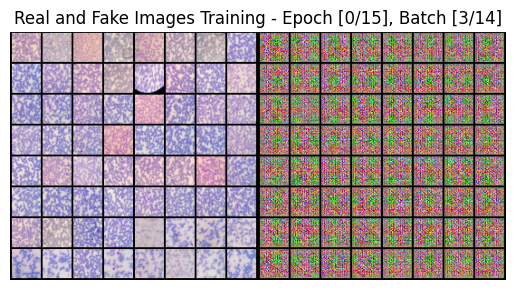

Epoch [0/15], Batch [4/14], Discriminator Loss: 0.8361, Generator Loss: 0.5929


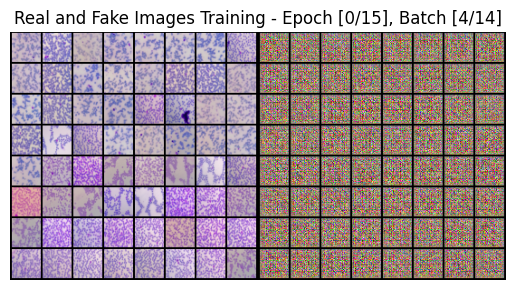

Epoch [0/15], Batch [5/14], Discriminator Loss: 0.6905, Generator Loss: 0.4922


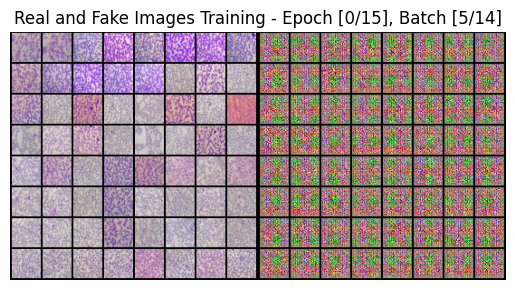

Epoch [0/15], Batch [6/14], Discriminator Loss: 0.5413, Generator Loss: 0.4149


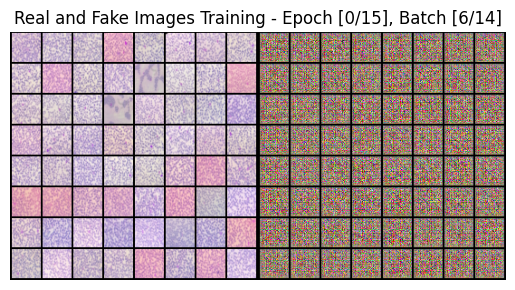

Epoch [0/15], Batch [7/14], Discriminator Loss: 0.4828, Generator Loss: 0.4224


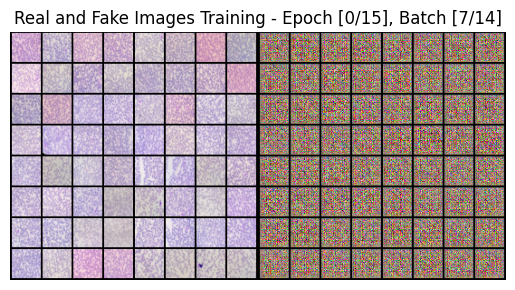

Epoch [0/15], Batch [8/14], Discriminator Loss: 0.8841, Generator Loss: 0.7256


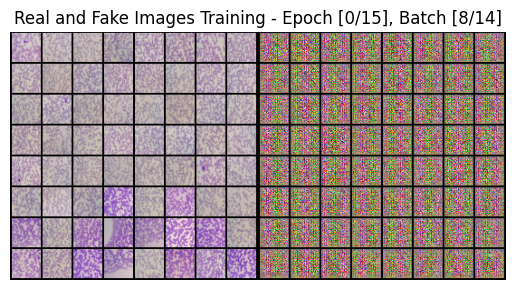

Epoch [0/15], Batch [9/14], Discriminator Loss: 0.6872, Generator Loss: 0.7533


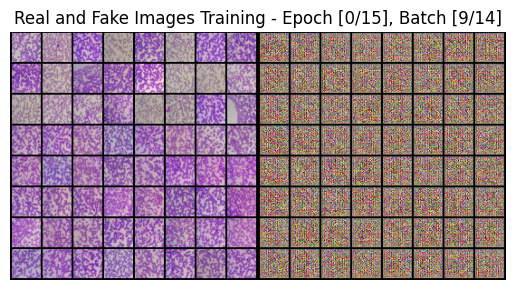

Epoch [0/15], Batch [10/14], Discriminator Loss: 0.8036, Generator Loss: 0.7224


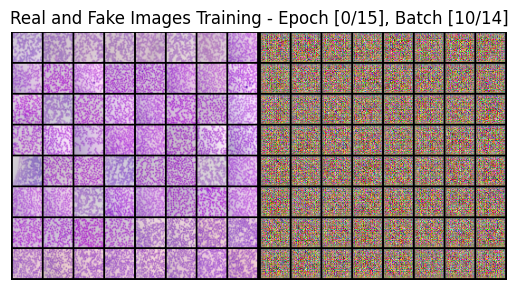

Epoch [0/15], Batch [11/14], Discriminator Loss: 0.6107, Generator Loss: 0.7207


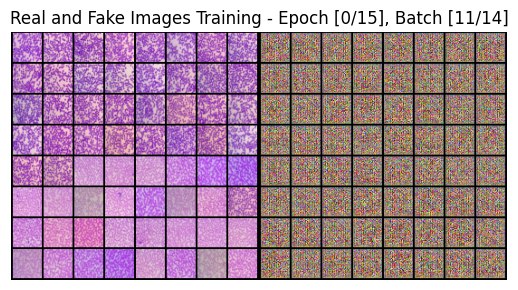

Epoch [0/15], Batch [12/14], Discriminator Loss: 0.5811, Generator Loss: 0.5999


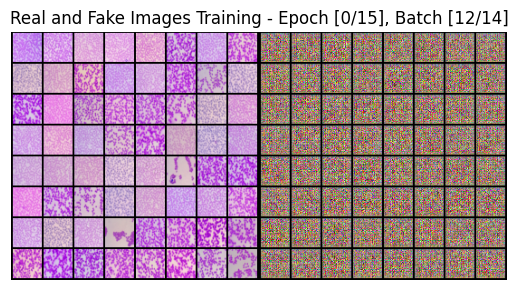

Epoch [0/15], Batch [13/14], Discriminator Loss: 0.6694, Generator Loss: 0.6229


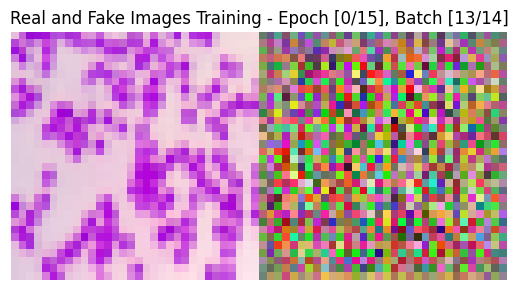

Epoch [0/15], Batch [0/1], Discriminator Loss: 0.7680, Generator Loss: 0.5206 on Validation Dataset


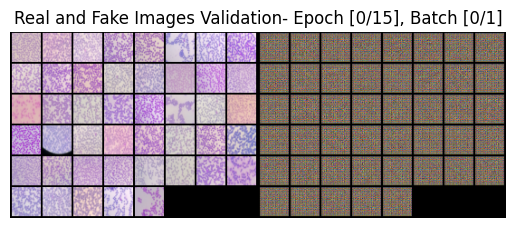

Training accuracy of discriminator head 0.6920768307322929, Validation accuracy of discriminator head 0.7222222222222222
Epoch [1/15], Batch [0/14], Discriminator Loss: 0.6726, Generator Loss: 0.5323


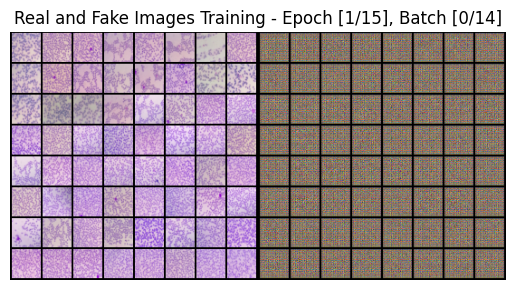

Epoch [1/15], Batch [1/14], Discriminator Loss: 0.6679, Generator Loss: 0.6131


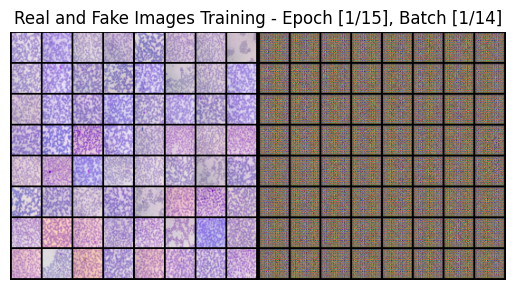

Epoch [1/15], Batch [2/14], Discriminator Loss: 0.4670, Generator Loss: 0.7749


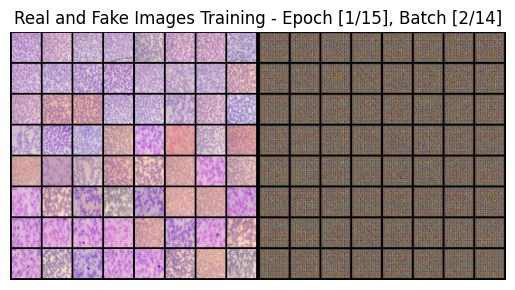

Epoch [1/15], Batch [3/14], Discriminator Loss: 0.4813, Generator Loss: 0.8667


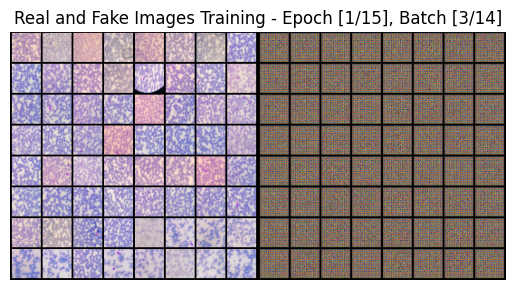

Epoch [1/15], Batch [4/14], Discriminator Loss: 0.6121, Generator Loss: 1.1148


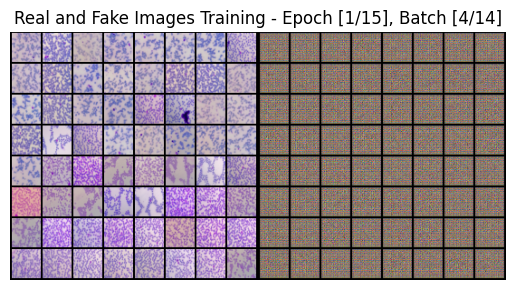

Epoch [1/15], Batch [5/14], Discriminator Loss: 0.4353, Generator Loss: 0.9712


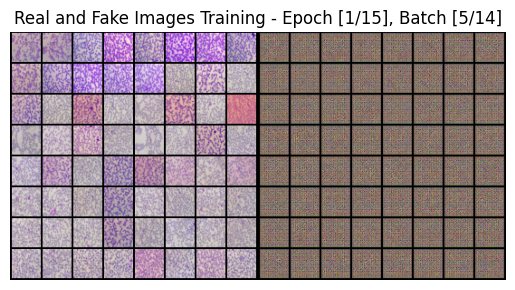

Epoch [1/15], Batch [6/14], Discriminator Loss: 0.2751, Generator Loss: 0.9170


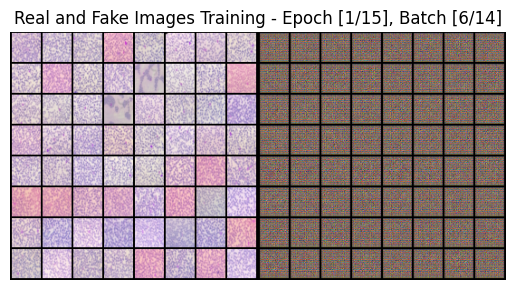

Epoch [1/15], Batch [7/14], Discriminator Loss: 0.2326, Generator Loss: 0.9623


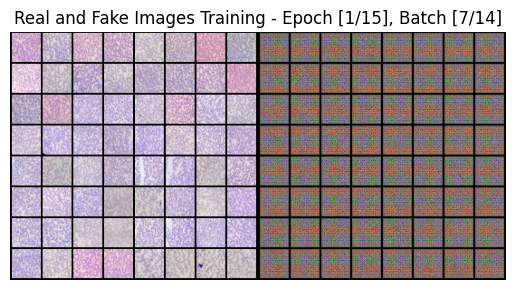

Epoch [1/15], Batch [8/14], Discriminator Loss: 0.9274, Generator Loss: 1.3439


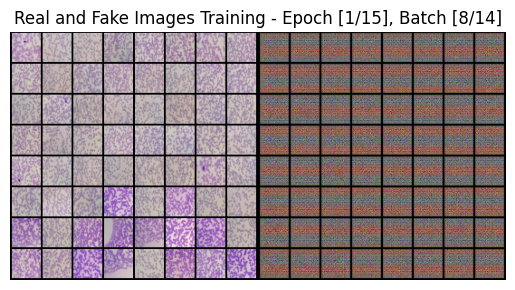

Epoch [1/15], Batch [9/14], Discriminator Loss: 0.4784, Generator Loss: 1.5096


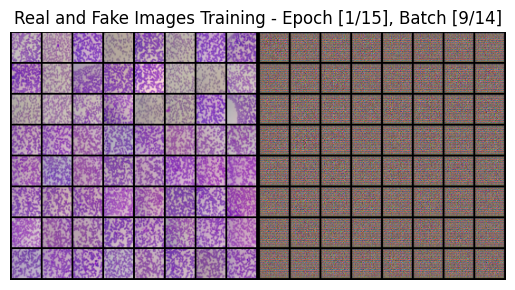

Epoch [1/15], Batch [10/14], Discriminator Loss: 0.6912, Generator Loss: 1.2916


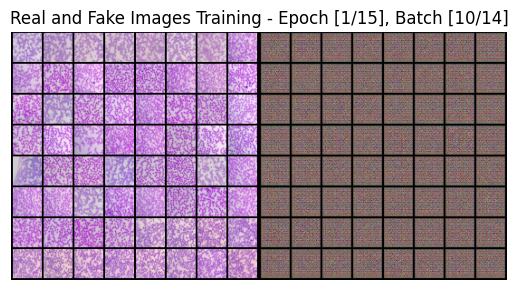

Epoch [1/15], Batch [11/14], Discriminator Loss: 0.4494, Generator Loss: 1.3987


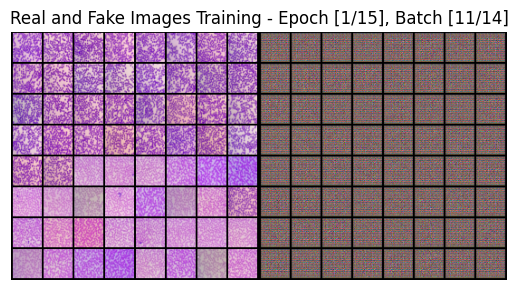

Epoch [1/15], Batch [12/14], Discriminator Loss: 0.4609, Generator Loss: 1.2074


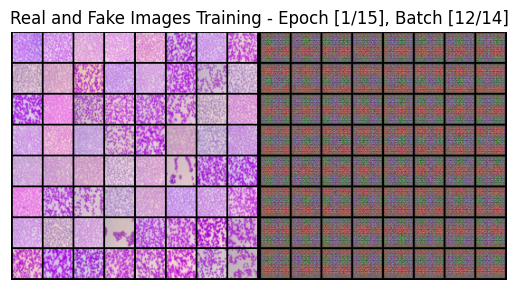

Epoch [1/15], Batch [13/14], Discriminator Loss: 0.4294, Generator Loss: 1.1216


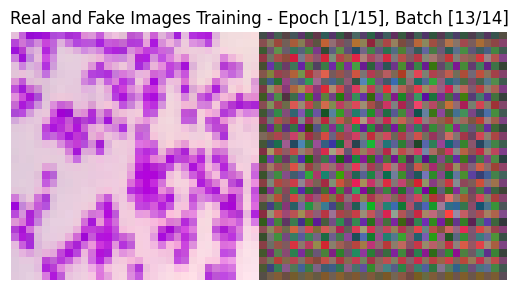

Epoch [1/15], Batch [0/1], Discriminator Loss: 0.4912, Generator Loss: 1.1272 on Validation Dataset


In [ ]:
save_interval = 1
disc_losses = []
gen_losses = []
disc_losses_val = []
gen_losses_val = []
disc_acc_train = []
disc_acc_val = []
i = 0
discriminator_loss = 0.0
generator_loss = 0.0
discriminator_loss_val = 0.0
generator_loss_val= 0.0
for epoch in range(num_epochs):
  trainy_true = []
  trainy_pred = []
  valy_true = []
  valy_pred = []
  for batch_idx, (images,labels) in enumerate(train_loader):
    #  print(labels)
     trainy_true.append(labels)
     batch_size = len(images)
     real_labels = labels.to(device)
     images = images.to(device)
    #  print(real_labels.size())
     fake_labels = torch.zeros(batch_size, 4).to(device)
    #  print(fake_labels.size())
     noise = torch.randn(batch_size, 100, 1, 1).to(device)
    #  print(noise.size())

     optimizer_discriminator.zero_grad()
     real_output = disc(images)
    #  print(real_output)
    #  print(real_labels)
     real_loss = criterion(real_output, real_labels)
    #  print(real_loss)
     real_loss.backward()


     fake_images = gen(noise)
    # #  print(fake_images.size())
     fake_output = disc(fake_images.detach())
     fake_loss = criterion(fake_output,fake_labels)
    #  print(fake_loss)
     fake_loss.backward()

     optimizer_discriminator.step()

     disc_loss = real_loss + fake_loss
    # #  print(disc_loss)
     discriminator_loss = discriminator_loss + disc_loss.item()
     binary_real_labels = (real_output >= 0.5).float()
    #  print(binary_real_labels)
     trainy_pred.append(binary_real_labels)

     optimizer_generator.zero_grad()
     output_fake = disc(fake_images)
     gen_loss = criterion(output_fake, real_labels)

     gen_loss.backward()
     optimizer_generator.step()
     generator_loss = generator_loss+gen_loss.item()


     if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(train_loader)}], "
                f"Discriminator Loss: {disc_loss.item():.4f}, "
                f"Generator Loss: {gen_loss.item():.4f}"
            )

     real_grid = torchvision.utils.make_grid(images, nrow=8, normalize=True)

     fake_grid = torchvision.utils.make_grid(fake_images, nrow=8, normalize=True)

     combined_grid = torch.cat((real_grid, fake_grid), dim=2)
     plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
     plt.title(f'Real and Fake Images Training - Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(train_loader)}]')
     plt.axis('off')
     plt.show()

  train_disc_loss = discriminator_loss/len(train_loader)
  train_gen_loss = generator_loss/len(train_loader)
  disc_losses.append(train_disc_loss)
  gen_losses.append(train_gen_loss)

  true_labels_train = torch.cat(trainy_true, dim=0)
  train_true_labels= true_labels_train.flatten().tolist()
  # print(len(train_true_labels))
  pred_labels_train = torch.cat(trainy_pred, dim=0)
  train_pred_labels = pred_labels_train.flatten().tolist()
  # print(len(train_pred_labels))

  train_accuracy = accuracy_score(train_true_labels, train_pred_labels)
  disc_acc_train.append(train_accuracy)


  disc.eval()
  gen.eval()
  with torch.no_grad():
    for batch_idx, (images,labels) in enumerate(val_loader):
      valy_true.append(labels)
      batch_size = len(images)
      real_labels = labels.to(device)
      images = images.to(device)
      fake_labels = torch.zeros(batch_size, 4).to(device)
      noise = torch.randn(batch_size, 100, 1, 1).to(device)
      real_output = disc(images)
      binary_real_labels = (real_output >= 0.5).float()
  #  print(binary_real_labels)
      valy_pred.append(binary_real_labels)
      real_loss = criterion(real_output, real_labels)

      fake_images = gen(noise)

      fake_output = disc(fake_images.detach())
      fake_loss = criterion(fake_output,fake_labels)
      disc_loss = real_loss + fake_loss
      discriminator_loss_val = discriminator_loss_val + disc_loss.item()

    output_fake = disc(fake_images)
    gen_loss = criterion(output_fake, real_labels)
    generator_loss_val = generator_loss_val+gen_loss.item()

    if i % 100 == 0:
      print(
          f"Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(val_loader)}], "
          f"Discriminator Loss: {disc_loss.item():.4f}, "
          f"Generator Loss: {gen_loss.item():.4f} on Validation Dataset"
      )

    real_grid = torchvision.utils.make_grid(images, nrow=8, normalize=True)

    fake_grid = torchvision.utils.make_grid(fake_images, nrow=8, normalize=True)

    combined_grid = torch.cat((real_grid, fake_grid), dim=2)
    plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
    plt.title(f'Real and Fake Images Validation- Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(val_loader)}]')
    plt.axis('off')
    plt.show()


  val_disc_loss = discriminator_loss_val/len(val_loader)
  val_gen_loss = generator_loss_val/len(val_loader)
  disc_losses_val.append(val_disc_loss)
  gen_losses_val.append(val_gen_loss)
  true_labels_val = torch.cat(valy_true, dim=0)
  val_true_labels= true_labels_val.flatten().tolist()
  # print(len(val_true_labels))
  pred_labels_val = torch.cat(valy_pred, dim=0)
  val_pred_labels = pred_labels_val.flatten().tolist()
  # print(len(val_pred_labels))

  val_accuracy = accuracy_score(val_true_labels, val_pred_labels)
  disc_acc_val.append(val_accuracy)
  print(f"Training accuracy of discriminator head {train_accuracy}, Validation accuracy of discriminator head {val_accuracy}")



x_axis = [i for i in range(len(disc_losses))]
plt.plot(x_axis, disc_losses, label='Discriminator Loss')
plt.plot(x_axis, gen_losses, label='Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training loss of Discriminator and Generator')
plt.show()

x_axis = [i for i in range(len(disc_losses_val))]
plt.plot(x_axis, disc_losses_val, label='Discriminator Loss')
plt.plot(x_axis, gen_losses_val, label='Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Validation loss of Discriminator and Generator')
plt.show()

x_axis = [i for i in range(len(disc_acc_train))]
plt.plot(x_axis, disc_acc_train, label='Training Accuracy')
plt.plot(x_axis, disc_acc_val, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Accuracy curve of training and validation of Discriminator')
plt.show()

if (epoch + 1) % save_interval == 0:
  save_path_disc = '/content/drive/MyDrive/DL_ASSIGN_05/Multi_GAN_disc_epoch_{}.pth'.format(epoch + 1)
  torch.save(disc.state_dict(), save_path_disc)

  save_path_gen = '/content/drive/MyDrive/DL_ASSIGN_05/Multi_GAN_gen_epoch_{}.pth'.format(epoch + 1)
  torch.save(gen.state_dict(), save_path_gen)

In [ ]:
disc_losses_test= []
gen_losses_test = []
discriminator_loss_test = 0.0
generator_loss_test = 0.0
disc.eval()
gen.eval()
with torch.no_grad():
  for batch_idx, (images,labels) in enumerate(test_loader):
    valy_true.append(labels)
    batch_size = len(images)
    real_labels = labels.to(device)
    images = images.to(device)
    fake_labels = torch.zeros(batch_size, 4).to(device)
    noise = torch.randn(batch_size, 100, 1, 1).to(device)
    real_output = disc(images)
    binary_real_labels = (real_output >= 0.5).float()
#  print(binary_real_labels)
    valy_pred.append(binary_real_labels)
    real_loss = criterion(real_output, real_labels)

    fake_images = gen(noise)

    fake_output = disc(fake_images.detach())
    fake_loss = criterion(fake_output,fake_labels)
    disc_loss = real_loss + fake_loss
    discriminator_loss_test = discriminator_loss_test + disc_loss.item()

    output_fake = disc(fake_images)
    gen_loss = criterion(output_fake, real_labels)
    generator_loss_test = generator_loss_test+gen_loss.item()

    if i % 100 == 0:
      print(
          f"Batch [{batch_idx}/{len(test_loader)}], "
          f"Discriminator Loss: {disc_loss.item():.4f}, "
          f"Generator Loss: {gen_loss.item():.4f} on Test Dataset"
      )

    real_grid = torchvision.utils.make_grid(images, nrow=8, normalize=True)

    fake_grid = torchvision.utils.make_grid(fake_images, nrow=8, normalize=True)

    combined_grid = torch.cat((real_grid, fake_grid), dim=2)
    plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
    plt.title(f'Real and Fake Images Test - , Batch [{batch_idx}/{len(test_loader)}]')
    plt.axis('off')
    plt.show()


test_disc_loss = discriminator_loss_test/len(test_loader)
test_gen_loss = generator_loss_test/len(test_loader)
print(f'Total loss of discriminator {test_disc_loss} and Total loss of generator {test_gen_loss}')
# disc_losses_test.append(test_disc_loss)
# gen_losses_test.append(test_gen_loss)



**GradCAM**

In [23]:
discriminator = Discriminator()

In [24]:
class VGG(nn.Module):
    def __init__(self):
        super(VGG, self).__init__()

        # get the pretrained VGG19 network
        self.disc = discriminator

        # disect the network to access its last convolutional layer
        self.features_conv = self.disc.discriminator

        # get the max pool of the features stem
        self.max_pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

        # get the classifier of the vgg19
        self.classifier = self.disc.classifier

        # placeholder for the gradients
        self.gradients = None

    # hook for the gradients of the activations
    def activations_hook(self, grad):
        self.gradients = grad

    def forward(self, x):
        x = self.features_conv(x)

        # register the hook
        h = x.register_hook(self.activations_hook)

        # apply the remaining pooling
        x = self.max_pool(x)
        x = x.view((1, -1))
        x = self.classifier(x)
        return x

    # method for the gradient extraction
    def get_activations_gradient(self):
        return self.gradients

    # method for the activation exctraction
    def get_activations(self, x):
        return self.features_conv(x)

In [25]:

# initialize the VGG model
disc = VGG()

# set the evaluation mode
disc.eval()

# get the image from the dataloader
img, _ = next(iter(test_loader))

# get the most likely prediction of the model
pred = disc(img).argmax(dim=1)
print(pred)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x32768 and 2048x2048)

In [46]:
# get the gradient of the output with respect to the parameters of the model
pred[:, 386].backward()

# pull the gradients out of the model
gradients = vgg.get_activations_gradient()

# pool the gradients across the channels
pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

# get the activations of the last convolutional layer
activations = vgg.get_activations(img).detach()

# weight the channels by corresponding gradients
for i in range(512):
    activations[:, i, :, :] *= pooled_gradients[i]

# average the channels of the activations
heatmap = torch.mean(activations, dim=1).squeeze()

# relu on top of the heatmap
# expression (2) in https://arxiv.org/pdf/1610.02391.pdf
heatmap = np.maximum(heatmap, 0)

# normalize the heatmap
heatmap /= torch.max(heatmap)

# draw the heatmap
plt.matshow(heatmap.squeeze())

In [29]:
import torch

# Assuming you have a list of tensors
tensor_list = [
    torch.tensor([[1., 0., 0., 0.], [1., 0., 0., 0.]]),  # First tensor
    torch.tensor([[1., 0., 0., 0.], [0., 1., 0., 0.]]),  # Second tensor
    torch.tensor([[0., 1., 0., 0.], [0., 1., 0., 0.]]),  # Third tensor
    torch.tensor([[0., 1., 0., 0.], [0., 1., 0., 0.]])   # Fourth tensor
]

# Concatenate all tensors into a single tensor along the first dimension (assuming they have the same shape)
concatenated_tensor = torch.cat(tensor_list, dim=0)
a = concatenated_tensor.flatten().tolist()
# Print the concatenated tensor
print(a)


[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]


In [ ]:
discriminator = Discriminator()
input_size = (3, 32, 32)
summary(discriminator, input_size)

In [ ]:
# for idx in range(len(train)):
#     image, label = train[idx]
#     print(f"Image: {image}")
#     print(f"Label: {label}")
#     print("-" * 20)

In [ ]:
num_epochs = 5
criterion = nn.BCELoss()
optimizer = optim.Adam(discriminator.parameters(), lr=0.001)


In [ ]:
training_losses = []
validation_losses = []
y_true = []
y_pred = []
for epoch in range(num_epochs):
    # Training loop
    discriminator.train()
    running_train_loss = 0.0
    total_samples = 0
    correct_predictions = 0
    for images, labels in train_loader:

        print(labels)

        optimizer.zero_grad()

        outputs = discriminator(images)
        print(outputs)

        loss = criterion(outputs, labels)
        # print(loss)
        loss.backward()
        optimizer.step()

        running_train_loss = running_train_loss + loss.item()

    train_loss = running_train_loss / len(train_loader)
    training_losses.append(train_loss)

    discriminator.eval()

    with torch.no_grad():
        running_val_loss = 0.0

        for images, labels in val_loader:

            optimizer.zero_grad()
            outputs = discriminator(images)
            loss = criterion(outputs, labels)

            running_val_loss = running_train_loss + loss.item()

        val_loss = running_val_loss / len(train_loader)
        validation_losses.append(val_loss)
    print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')


In [ ]:
all_predicted_labels = np.concatenate(y_pred)
all_true_labels = np.concatenate(y_true)
confusion_mat = confusion_matrix(all_true_labels, all_predicted_labels)
f1 = f1_score(all_true_labels, all_predicted_labels,average='macro')
accuracy = accuracy_score(all_true_labels, all_predicted_labels)
print(f'Accuracy: {accuracy:.2%}')
print(f'F1_Score: {f1:.2%}')
print(f'Confusion_Matrix: {confusion_mat}')

x_axis = [i for i in range(len(training_losses))]
plt.plot(x_axis, training_losses, label='Train Loss')
plt.plot(x_axis, validation_losses, label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


In [ ]:

y_true_test = []
y_pred_test = []
test_losses = []
vgg16.eval()

with torch.no_grad():
    running_test_loss = 0.0
    total_samples = 0
    correct_predictions = 0
    for images, labels in test_loader:

        # print(labels)
        outputs = discriminator(images)
        # print(outputs)
        loss = criterion(outputs, labels)
        running_test_loss = running_test_loss + loss.item()

    test_loss = running_test_loss / len(test_loader)
    test_losses.append(test_loss)
    print(f'Test Loss: {test_loss:.4f}')



In [ ]:
all_predicted_labels = np.concatenate(y_pred_test)
all_true_labels = np.concatenate(y_true_test)

confusion_mat = confusion_matrix(all_true_labels, all_predicted_labels)
f1 = f1_score(all_true_labels, all_predicted_labels,average='macro')
accuracy = accuracy_score(all_true_labels, all_predicted_labels)
print(f'Accuracy: {accuracy:.2%}')
print(f'F1_Score: {f1:.2%}')
print(f'Confusion_Matrix: {confusion_mat}')
x_axis_test = [i for i in range(len(test_losses))]
plt.plot(x_axis_test, test_losses, label='Test Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.title('Test Loss')
plt.show()



In [ ]:
import torch
import torch.nn as nn

# Example data (replace with your actual data)
predicted_probs = torch.tensor([0.8, 0.2, 0.6, 0.4])  # Example predicted probabilities (after sigmoid activation)
true_labels = torch.tensor([1.0, 0.0, 1.0, 0.0])  # Example true binary labels
print(predicted_probs)
# Apply sigmoid activation to the predicted probabilities (if not already applied)
predicted_probs_sigmoid = torch.sigmoid(predicted_probs)
print(predicted_probs_sigmoid)
# Compute Binary Cross Entropy Loss
bce_loss = nn.BCELoss()
loss = bce_loss(predicted_probs_sigmoid, true_labels)

print("Binary Cross Entropy Loss:", loss.item())


In [ ]:
image_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/train/Malaria_CM12_14Jul2021163237_0001_138.8_14.1_400x.png'
image = Image.open(image_path)

# Display the image
image.show()